In [1]:
from pymongo import MongoClient
import tldextract
import matplotlib.pyplot as plt
import networkx as nx
import pygraphviz
from networkx.drawing.nx_agraph import graphviz_layout
from scipy.stats import norm
import itertools
import math
import numpy as np
import re
import pickle
import csv
import feather
from tqdm import tqdm
import json

In [2]:
re_3986 = re.compile(r"^(([^:/?#]+):)?(//([^/?#]*))?([^?#]*)(\?([^#]*))?(#(.*))?")

bias = []
biasnames = []
pol = ['L', 'LC', 'C', 'RC', 'R']
rep = ['VERY LOW', 'LOW', 'MIXED', 'HIGH', 'VERY HIGH']
flag = ['F', 'X', 'S']
with open('bias.csv', 'r') as csvfile:
    reader = csv.reader(csvfile)
    for row in reader:
        name = re_3986.match(row[4]).group(4)
        p = -1
        r = -1
        f = -1
        if row[1] in pol:
            p = pol.index(row[1])
        if row[2] in rep:
            r = rep.index(row[2])
        if row[3] in flag:
            f = flag.index(row[3])
        bias.append(row + [name, p, r, f, 1 if p == -1 else 0])
        biasnames.append(name)
#print(bias)

In [3]:
with open('save.json') as data_file:    
    counts = json.load(data_file)

domains = set()

for cat in counts:
    for src in tqdm(counts[cat]):
        if src not in domains:
            domains.add(src)
        for dst in counts[cat]:
            if dst not in domains:
                domains.add(dst)
            

100%|██████████| 16246/16246 [00:38<00:00, 420.44it/s]


21247
[44, 65, 35, 25, 31, 0, 5, 51, 142, 11, 15, 14, 1]
[[   0.    6.   24.    3.    0.]
 [  99.  171.   72.   54.   30.]
 [  33.   15.    0.   18.   60.]]


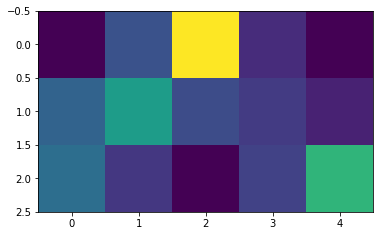

['wattsupwiththat.com', 'americanfreepress.net', 'healthimpactnews.com', 'gulagbound.com', 'csglobe.com']


In [4]:
labels = pol + rep + flag
c = [0]*13
cm = np.zeros((3, 5))
l = []
for x in range(13):
    l.append([])

for dom in domains:
    if dom in biasnames:
        datum = bias[biasnames.index(dom)][1:4]
        for i in range(3):
            if datum[i] in labels:
                c[labels.index(datum[i])] += 1
                l[labels.index(datum[i])].append(dom)
            if datum[1] in rep and datum[0] in pol:
                cm[4-rep.index(datum[1]),pol.index(datum[0])] += 1
print(len(domains))
print(c)
print(cm)
plt.imshow(cm/np.sum(cm,axis=1)[:, np.newaxis], interpolation="nearest")
plt.show()
print(l[6])
        

In [14]:
mcounts = {}
for src in counts["a"]:
    for dst in counts["a"][src]:
        if dst in counts["a"] and src in counts["a"][dst]:
            if src not in mcounts:
                mcounts[src] = {}
            if dst not in mcounts[src]:
                mcounts[src][dst] = counts["a"][src][dst]

mw = {}
for src in mcounts:
    mw[src] = {}
    exp = sum([mcounts[src][k] for k in mcounts[src]])/(len(mcounts[src]))
    for dst in mcounts[src]:
        mw[src][dst] = (mcounts[src][dst]-exp)/math.sqrt(exp)
        #print(mw[src][dst])
print(len(mcounts))

#print(mcounts)

6510


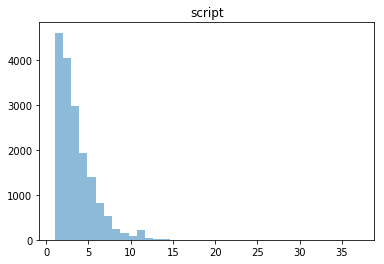

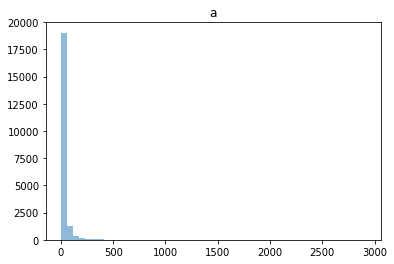

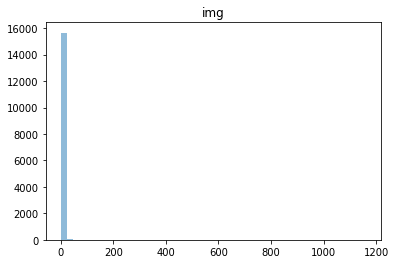

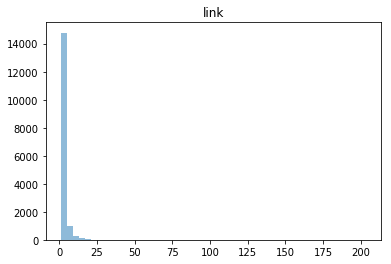

In [15]:
b = {'a':[], 'img':[], 'script':[], 'link':[]}
for key in counts:
    for src in counts[key]:
        b[key].append(len(counts[key][src]))
#print(counts['script']['nytimes.com'])
for i, k in enumerate(b):
    n, bins, patches = plt.hist(b[k], int(min(max(b[k]),50)), normed=0, label=k, alpha=0.5)
    plt.title(k)
    plt.show()

In [16]:
def lessMag(a, b):
    if abs(a) < abs(b):
        return a
    else:
        return b

In [58]:
def makeMutGraph(boss=False, minsamp=2, weight='bold'):
    G = nx.Graph()
    for src in mcounts:
        for dst in mcounts[src]:
            if mcounts[src][dst] > minsamp and mcounts[dst][src] > minsamp:
                G.add_edge(src, dst)

    chunks = [g for g in nx.connected_component_subgraphs(G.to_undirected())]
    meta = nx.Graph()
    for chunk in chunks:
        if len(chunk) > 3:
            meta = nx.compose(meta, chunk)
    if boss:
        meta = max(chunks, key=len)
    good = meta.nodes()
    
    G = nx.Graph()
    
    for src in mcounts:
        for dst in mcounts[src]:
            if src in good and dst in good:
                if mcounts[src][dst] > minsamp and mcounts[dst][src] > minsamp:
                    G.add_edge(src, dst, weight=1)#=mcounts[src][dst]+mcounts[dst][src])

    #d = [G.degree()[k] for k in G.nodes()]
    #mds = np.where(np.array(d) >= sorted(d)[-5])[0]
    #for md in mds:
    #    print(G.nodes()[md] + " : " + str(d[md]))
                    
    pos = graphviz_layout(G, 'neato')

    ec = [0]*len(G.edges())
    ew = [0]*len(G.edges())
    ns = [0]*len(G.nodes())
    for src in mcounts:
        for dst in mcounts[src]:
            if dst in G.nodes() and src in G.nodes():
                ns[G.nodes().index(dst)] += 1
                #ns[G.nodes().index(dst)] += (mcounts[src][dst] / sum([mcounts[src][d] for d in mcounts[src]]))
    ns = [n*20 for n in ns]
    
    i = 0
    nc = [0 for n in ns]
    for i, n in enumerate(G.nodes()):
        if n in biasnames:
            nc[i] = bias[biasnames.index(n)][9]
            #print([key for key in nx.all_neighbors(G, n)])
            i += 1
        else:
            ns[i] = 0
            
    #maWe = 0
    #miWe = 100
    for i, edge in enumerate(G.edges(data=True)):
        src = edge[0]
        dst = edge[1]
        ec[i] = lessMag(mw[src][dst],mw[dst][src])
        ew[i] = edge[2]['weight']
        #ew[i] = math.log(ew[i])
        #maWe = max(maWe, ew[i])
        #miWe = min(miWe, ew[i])
    #print("Min Weight: " + str(miWe))
    #print("Max Weight: " + str(maWe))

    plt.figure(1, (20, 20))
    nx.draw(G, pos, node_size=ns, node_color=nc, cmap=plt.cm.coolwarm, edge_color=ec, edge_cmap=plt.cm.viridis, width=ew)
    nx.draw_networkx_labels(G, pos, font_weight=weight)
    plt.show()

/usr/local/lib/python3.5/dist-packages/networkx/drawing/nx_pylab.py:126: MatplotlibDeprecationWarning: pyplot.hold is deprecated.
    Future behavior will be consistent with the long-time default:
    plot commands add elements without first clearing the
    Axes and/or Figure.
  b = plt.ishold()
/usr/local/lib/python3.5/dist-packages/networkx/drawing/nx_pylab.py:138: MatplotlibDeprecationWarning: pyplot.hold is deprecated.
    Future behavior will be consistent with the long-time default:
    plot commands add elements without first clearing the
    Axes and/or Figure.
  plt.hold(b)
/usr/local/lib/python3.5/dist-packages/matplotlib/__init__.py:917: UserWarning: axes.hold is deprecated. Please remove it from your matplotlibrc and/or style files.
  warnings.warn(self.msg_depr_set % key)
/usr/local/lib/python3.5/dist-packages/matplotlib/rcsetup.py:152: UserWarning: axes.hold is deprecated, will be removed in 3.0
  warnings.warn("axes.hold is deprecated, will be removed in 3.0")


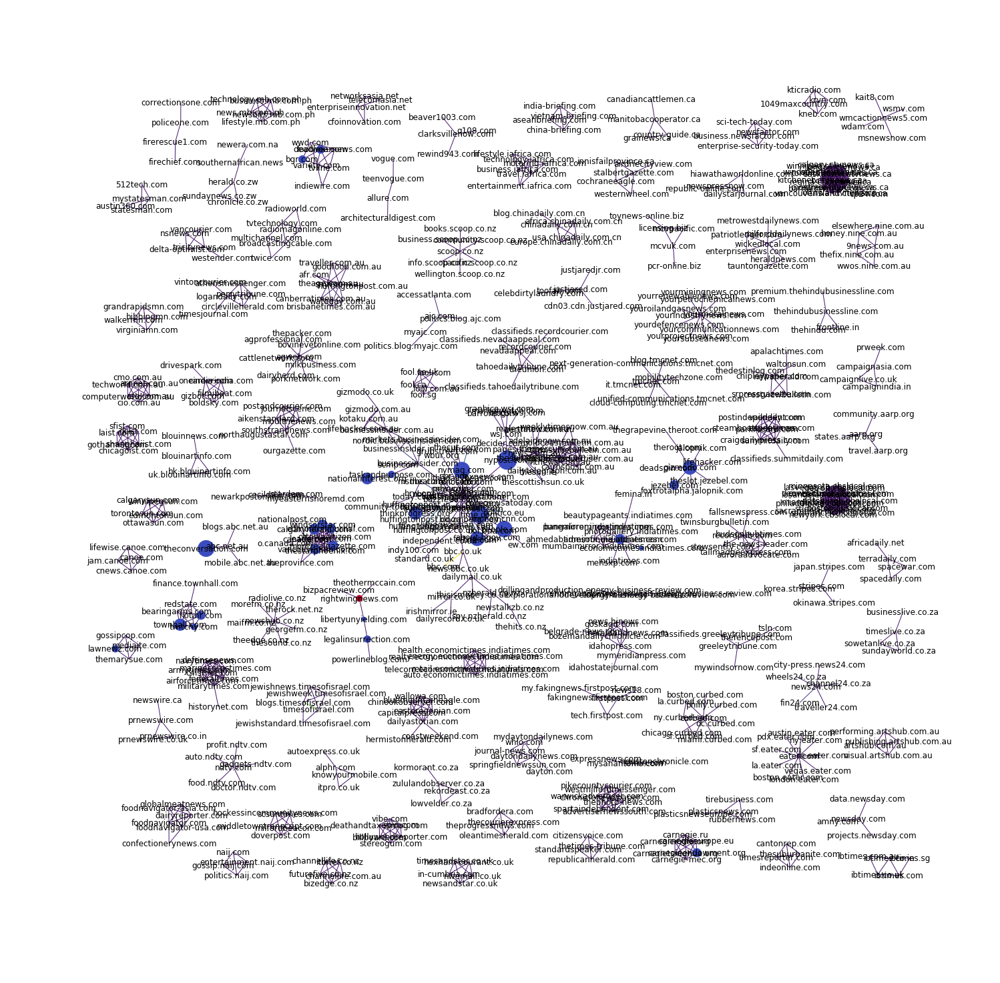

In [59]:
makeMutGraph(minsamp=20, weight='normal')

/usr/local/lib/python3.5/dist-packages/networkx/drawing/nx_pylab.py:126: MatplotlibDeprecationWarning: pyplot.hold is deprecated.
    Future behavior will be consistent with the long-time default:
    plot commands add elements without first clearing the
    Axes and/or Figure.
  b = plt.ishold()
/usr/local/lib/python3.5/dist-packages/networkx/drawing/nx_pylab.py:138: MatplotlibDeprecationWarning: pyplot.hold is deprecated.
    Future behavior will be consistent with the long-time default:
    plot commands add elements without first clearing the
    Axes and/or Figure.
  plt.hold(b)
/usr/local/lib/python3.5/dist-packages/matplotlib/__init__.py:917: UserWarning: axes.hold is deprecated. Please remove it from your matplotlibrc and/or style files.
  warnings.warn(self.msg_depr_set % key)
/usr/local/lib/python3.5/dist-packages/matplotlib/rcsetup.py:152: UserWarning: axes.hold is deprecated, will be removed in 3.0
  warnings.warn("axes.hold is deprecated, will be removed in 3.0")


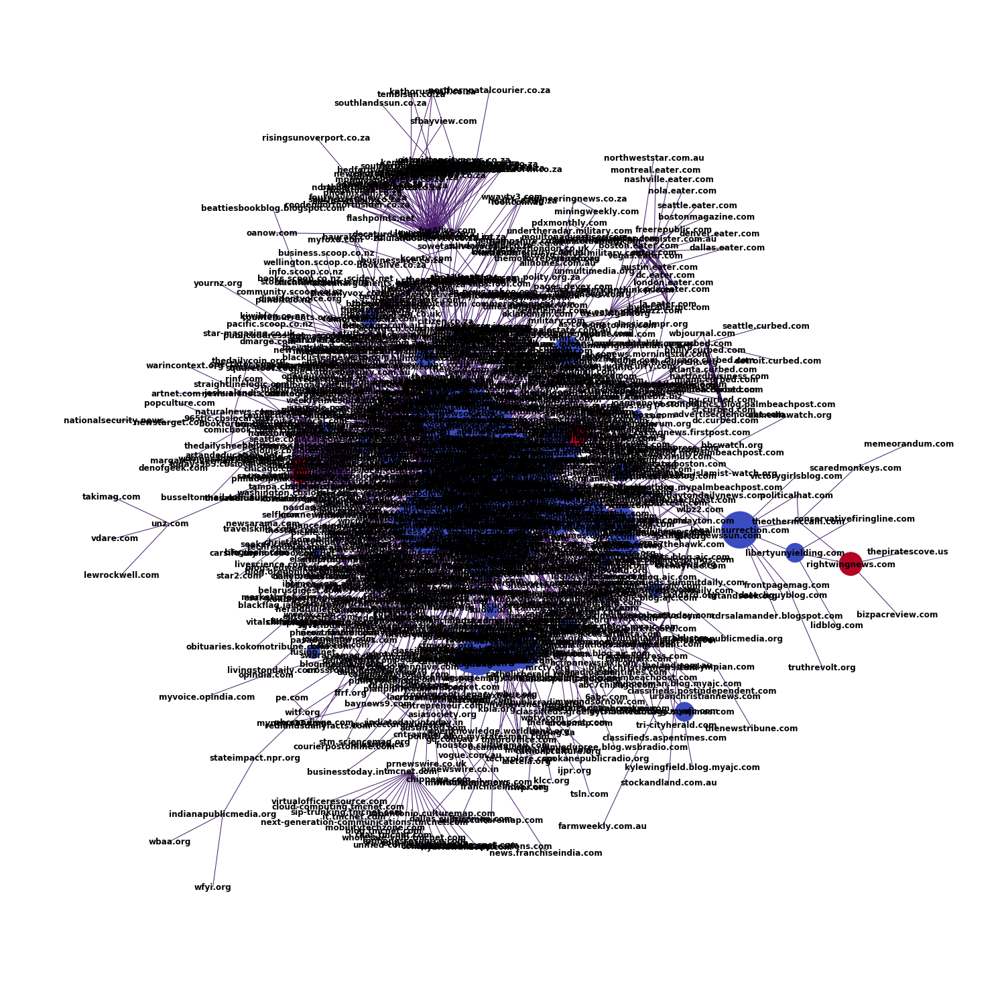

In [22]:
makeMutGraph(boss=True, minsamp=1)

In [49]:
def cSize(cliq):
    i = 0
    for dst in cliq:
        i += sum([mcounts[src][dst] for src in mcounts if dst in mcounts[src]])
    return i

def makeMutCliques(boss=False, minsamp=1):
    G = nx.Graph()
    for src in mcounts:
        for dst in mcounts[src]:
            if mcounts[src][dst] > minsamp and mcounts[dst][src] > minsamp:
                G.add_edge(src, dst)
    if boss:
        G = max(nx.connected_component_subgraphs(G), key=len)
    
    cliques = [x for x in reversed(sorted(nx.find_cliques(G), key=cSize)) if len(x) > 2]
    plt.clf()
    plt.figure(figsize=(20, 20))
    s = 7
    H = nx.Graph()
    for i, clique in enumerate(cliques):
        if len(clique) > 5: #and i < s*s:
            G = nx.Graph()
            for src in clique:
                for dst in mcounts[src]:
                    if dst in clique:
                        G.add_edge(src, dst)
            H = nx.compose(H, G)
            
    nc = [0]*len(H.nodes())
    ns = [500]*len(H.nodes())
    for j, n in enumerate(H.nodes()):
        if n in biasnames:
            #print(n)
            nc[j] = bias[biasnames.index(n)][9]
            #print(nc[j])
        else:
            ns[j] = 0
#             pos = graphviz_layout(G, 'neato')
#             ax = plt.subplot(s, s, min(i+1, s*s))
#             nx.draw(G, pos, ax=ax, cmap=plt.cm.coolwarm, vmin=0, vmax=1, node_color=nc, node_size=ns)
#             nx.draw_networkx_labels(G, pos, ax=ax)
    pos = graphviz_layout(H, 'neato')
    nx.draw(H, pos, cmap=plt.cm.coolwarm, vmin=0, vmax=0, node_color=nc, node_size=ns)
    nx.draw_networkx_labels(H, pos)
    #plt.tight_layout()
    plt.show()

/usr/local/lib/python3.5/dist-packages/networkx/drawing/nx_pylab.py:126: MatplotlibDeprecationWarning: pyplot.hold is deprecated.
    Future behavior will be consistent with the long-time default:
    plot commands add elements without first clearing the
    Axes and/or Figure.
  b = plt.ishold()
/usr/local/lib/python3.5/dist-packages/networkx/drawing/nx_pylab.py:138: MatplotlibDeprecationWarning: pyplot.hold is deprecated.
    Future behavior will be consistent with the long-time default:
    plot commands add elements without first clearing the
    Axes and/or Figure.
  plt.hold(b)
/usr/local/lib/python3.5/dist-packages/matplotlib/__init__.py:917: UserWarning: axes.hold is deprecated. Please remove it from your matplotlibrc and/or style files.
  warnings.warn(self.msg_depr_set % key)
/usr/local/lib/python3.5/dist-packages/matplotlib/rcsetup.py:152: UserWarning: axes.hold is deprecated, will be removed in 3.0
  warnings.warn("axes.hold is deprecated, will be removed in 3.0")


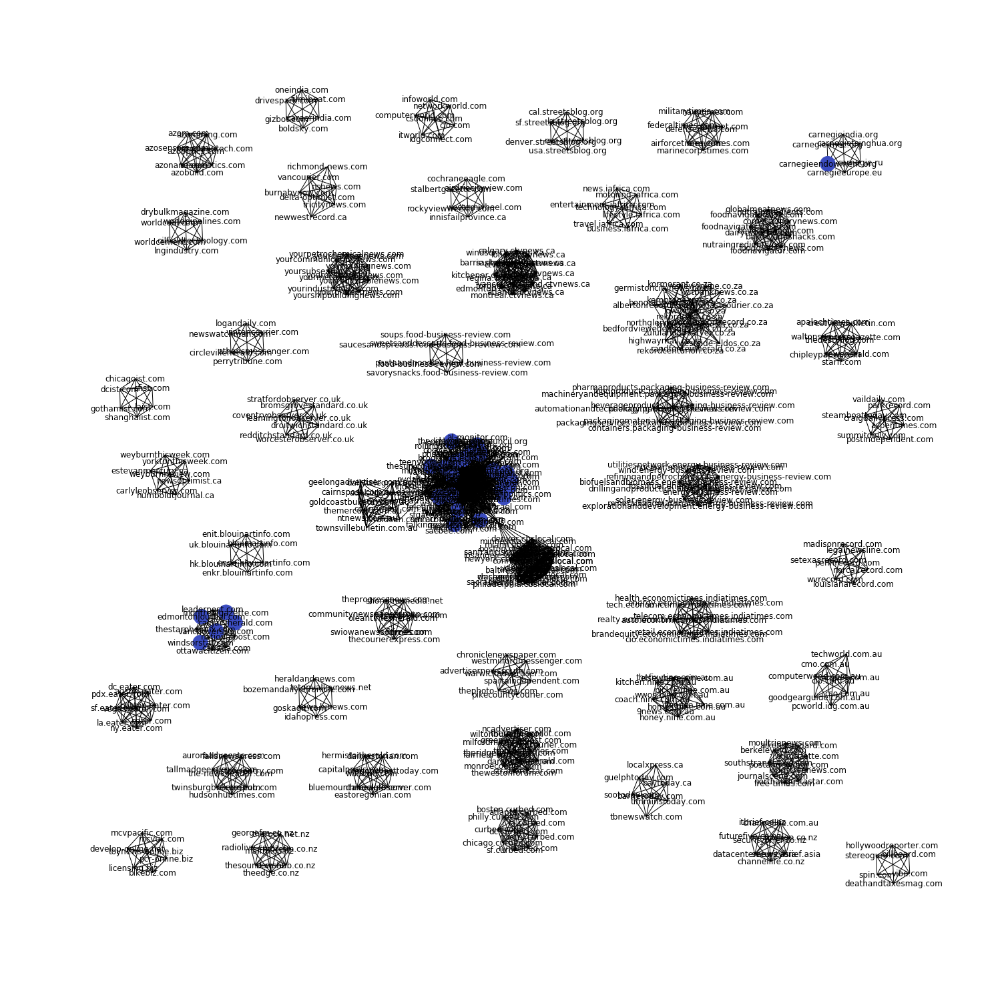

In [50]:
makeMutCliques()

In [46]:
def makeMutStars(boss=False, minsamp=1):
    G = nx.Graph()
    for src in mcounts:
        for dst in mcounts[src]:
            G.add_edge(src, dst)
    if boss:
        G = max(nx.connected_component_subgraphs(G), key=len)
    
    d = [sum([1 for x in nx.all_neighbors(G, node)]) for node in G.nodes()]
    centers = sorted(G.nodes(), key=lambda node: sum([1 for f in nx.all_neighbors(G, node) if d[G.nodes().index(f)] == 1]))
    
    plt.clf()
    plt.figure(figsize=(20, 20))
    
    H = nx.Graph()
    for i, center in enumerate(reversed(centers)):
        c = 0
        pals = []
        for pal in nx.all_neighbors(G, center):
            if d[G.nodes().index(pal)] == 1:
                c += 1
                pals.append(pal)
        if c > 5:
            for pal in pals:
                H.add_edge(center, pal)
                    
    nc = [0]*len(H.nodes())
    ns = [500]*len(H.nodes())
    ls = {}
    
    for j, n in enumerate(H.nodes()):
        if n in biasnames:
            nc[j] = bias[biasnames.index(n)][9]
        else:
            ns[j] = 0
        if sum([1 for x in nx.all_neighbors(H, n)]) > 1:
            ls[n] = n
        else:
            ls[n] = ""
    
    pos = graphviz_layout(H, 'neato')
    nx.draw(H, pos, cmap=plt.cm.coolwarm, vmin=0, vmax=1, node_color=nc, node_size=ns)
    nx.draw_networkx_labels(H, pos)
    nx.draw_networkx_labels(H, pos, ls, font_size=16, font_color="r", font_style="bold")
    plt.show()

/usr/local/lib/python3.5/dist-packages/networkx/drawing/nx_pylab.py:126: MatplotlibDeprecationWarning: pyplot.hold is deprecated.
    Future behavior will be consistent with the long-time default:
    plot commands add elements without first clearing the
    Axes and/or Figure.
  b = plt.ishold()
/usr/local/lib/python3.5/dist-packages/networkx/drawing/nx_pylab.py:138: MatplotlibDeprecationWarning: pyplot.hold is deprecated.
    Future behavior will be consistent with the long-time default:
    plot commands add elements without first clearing the
    Axes and/or Figure.
  plt.hold(b)
/usr/local/lib/python3.5/dist-packages/matplotlib/__init__.py:917: UserWarning: axes.hold is deprecated. Please remove it from your matplotlibrc and/or style files.
  warnings.warn(self.msg_depr_set % key)
/usr/local/lib/python3.5/dist-packages/matplotlib/rcsetup.py:152: UserWarning: axes.hold is deprecated, will be removed in 3.0
  warnings.warn("axes.hold is deprecated, will be removed in 3.0")


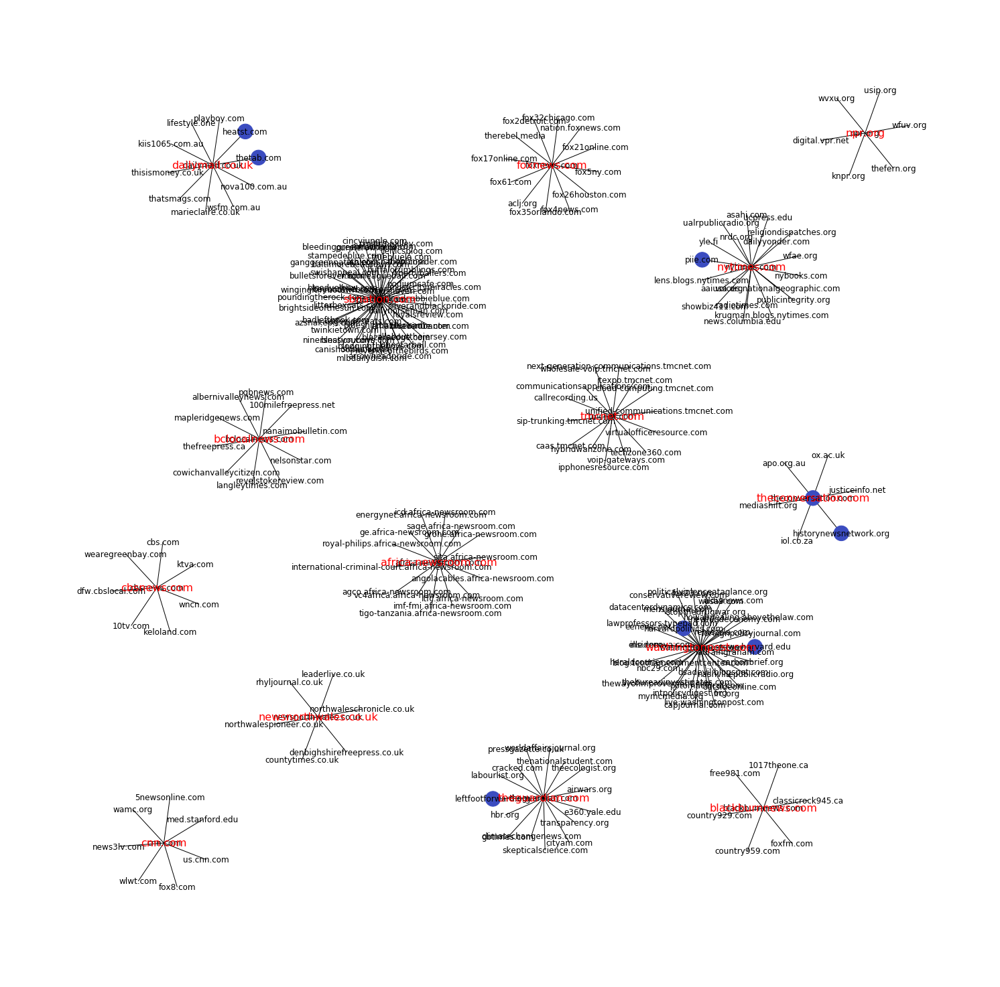

In [48]:
makeMutStars()

In [27]:
def getD(g):
    d = 0
    for node in g.nodes():
        for k in mcounts[node]:
            d += mcounts[node][k]
    return d

def makeMutSubgraphs(minsamp=2, top=25):
    G = nx.Graph()
    for src in mcounts:
        for dst in mcounts[src]:
            if mcounts[src][dst] > minsamp and mcounts[dst][src] > minsamp:
                G.add_edge(src, dst)
    H = nx.Graph()
    for i, I in enumerate(reversed(sorted(nx.connected_component_subgraphs(G), key=getD))):
        if i < top:
            H = nx.compose(H, I)
                    
    nc = [0]*len(H.nodes())
    ns = [500]*len(H.nodes())
    
    for j, n in enumerate(H.nodes()):
        if n in biasnames:
            nc[j] = bias[biasnames.index(n)][9]
        else:
            ns[j] = 0
    
    plt.figure(figsize=(20, 20))
    pos = graphviz_layout(H, 'neato')
    nx.draw(H, pos, cmap=plt.cm.coolwarm, vmin=0, vmax=1, node_color=nc, node_size=ns)
    nx.draw_networkx_labels(H, pos)
    plt.show()

/usr/local/lib/python3.5/dist-packages/networkx/drawing/nx_pylab.py:126: MatplotlibDeprecationWarning: pyplot.hold is deprecated.
    Future behavior will be consistent with the long-time default:
    plot commands add elements without first clearing the
    Axes and/or Figure.
  b = plt.ishold()
/usr/local/lib/python3.5/dist-packages/networkx/drawing/nx_pylab.py:138: MatplotlibDeprecationWarning: pyplot.hold is deprecated.
    Future behavior will be consistent with the long-time default:
    plot commands add elements without first clearing the
    Axes and/or Figure.
  plt.hold(b)
/usr/local/lib/python3.5/dist-packages/matplotlib/__init__.py:917: UserWarning: axes.hold is deprecated. Please remove it from your matplotlibrc and/or style files.
  warnings.warn(self.msg_depr_set % key)
/usr/local/lib/python3.5/dist-packages/matplotlib/rcsetup.py:152: UserWarning: axes.hold is deprecated, will be removed in 3.0
  warnings.warn("axes.hold is deprecated, will be removed in 3.0")


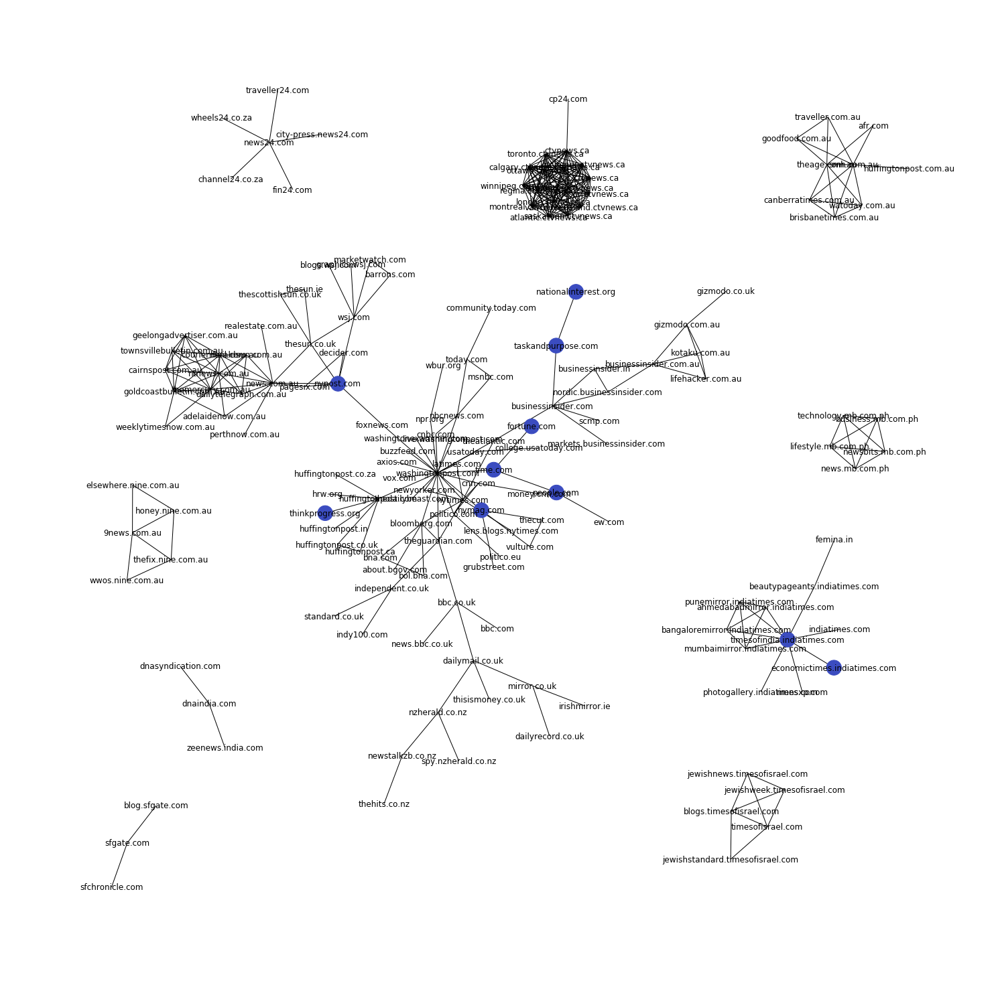

In [61]:
makeMutSubgraphs(minsamp=20, top=10)

In [29]:
def makeDiGraph(boss=False, key='img', minsamp=100, weight='bold'):
    blacklist = ['www.facebook.com', 'facebook.com', 'www.twitter.com', 'twitter.com', 'plus.google.com', 'play.google.com', \
                 'linkedin.com', 'www.instagram.com', 'instagram.com', 'www.youtube.com', 'www.linkedin.com', 'itunes.apple.com']
    P = nx.MultiDiGraph()
    c = counts[key] 
    for src in c:
        for dst in c[src]:
            if c[src][dst] > minsamp and src not in blacklist and dst not in blacklist:
                P.add_edge(src, dst)

    chunks = [p for p in nx.connected_component_subgraphs(P.to_undirected())]
    meta = nx.MultiDiGraph()
    for chunk in chunks:
        if len(chunk) > 3:
            meta = nx.compose(meta, chunk)
    if boss:
        meta = max(chunks, key=len)
    else:
        weight = 'normal'
    good = meta.nodes()
    
    I = nx.MultiDiGraph()
    for src in c:
        for dst in c[src]:
            if src in good and dst in good and c[src][dst] > minsamp:
                I.add_edge(src, dst, weight=1)#c[src][dst])
    plt.show()
    pos = graphviz_layout(I)
    
    #d = [I.degree()[k] for k in I.nodes()]
    #mds = np.where(np.array(d) >= sorted(d)[-10])[0]
    #for md in mds:
        #print(I.nodes()[md] + " : " + str(d[md]))
        #print([key for key in nx.all_neighbors(I, I.nodes()[md])])

    ec = [0]*len(I.edges())
    ew = [0]*len(I.edges())
    ns = [0]*len(I.nodes())
    for src in c:
        for dst in c[src]:
            if dst in I.nodes():
                ns[I.nodes().index(dst)] += 10#c[src][dst]/100
                
    i = 0
    nc = [0 for n in ns]
    for i, n in enumerate(I.nodes()):
        if n in biasnames:
            nc[i] = bias[biasnames.index(n)][9]
            #print([key for key in nx.all_neighbors(G, n)])
            i += 1
        else:
            ns[i] = 0
            
    maWe = 0
    miWe = 100
    for i, edge in enumerate(I.edges(data=True)):
        src = edge[0]
        dst = edge[1]
        ec[i] = c[src][dst]
        ew[i] = edge[2]['weight']#/10
        maWe = max(maWe, ew[i])
        miWe = min(miWe, ew[i])
    print("Min Weight: " + str(miWe))
    print("Max Weight: " + str(maWe))

    plt.figure(1, (20, 20))
    nx.draw(I, pos, node_size=ns, node_color=nc, cmap=plt.cm.coolwarm, edge_color=ec, edge_cmap=plt.cm.viridis, width=ew)
    nx.draw_networkx_labels(I, pos, font_weight=weight)
    plt.show()

Min Weight: 1
Max Weight: 1


/usr/local/lib/python3.5/dist-packages/networkx/drawing/nx_pylab.py:126: MatplotlibDeprecationWarning: pyplot.hold is deprecated.
    Future behavior will be consistent with the long-time default:
    plot commands add elements without first clearing the
    Axes and/or Figure.
  b = plt.ishold()
/usr/local/lib/python3.5/dist-packages/networkx/drawing/nx_pylab.py:138: MatplotlibDeprecationWarning: pyplot.hold is deprecated.
    Future behavior will be consistent with the long-time default:
    plot commands add elements without first clearing the
    Axes and/or Figure.
  plt.hold(b)
/usr/local/lib/python3.5/dist-packages/matplotlib/__init__.py:917: UserWarning: axes.hold is deprecated. Please remove it from your matplotlibrc and/or style files.
  warnings.warn(self.msg_depr_set % key)
/usr/local/lib/python3.5/dist-packages/matplotlib/rcsetup.py:152: UserWarning: axes.hold is deprecated, will be removed in 3.0
  warnings.warn("axes.hold is deprecated, will be removed in 3.0")


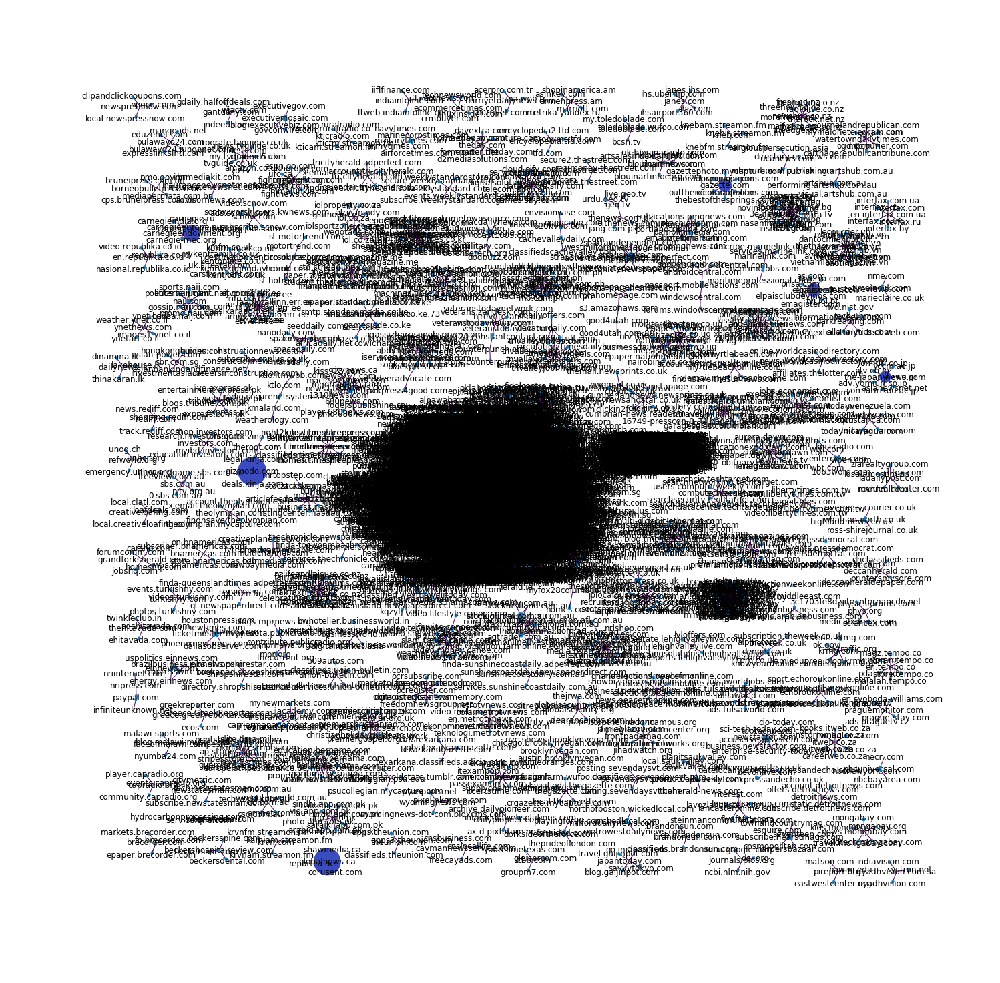

In [51]:
makeDiGraph(key='a', minsamp=300)

Min Weight: 1
Max Weight: 1


/usr/local/lib/python3.5/dist-packages/networkx/drawing/nx_pylab.py:126: MatplotlibDeprecationWarning: pyplot.hold is deprecated.
    Future behavior will be consistent with the long-time default:
    plot commands add elements without first clearing the
    Axes and/or Figure.
  b = plt.ishold()
/usr/local/lib/python3.5/dist-packages/networkx/drawing/nx_pylab.py:138: MatplotlibDeprecationWarning: pyplot.hold is deprecated.
    Future behavior will be consistent with the long-time default:
    plot commands add elements without first clearing the
    Axes and/or Figure.
  plt.hold(b)
/usr/local/lib/python3.5/dist-packages/matplotlib/__init__.py:917: UserWarning: axes.hold is deprecated. Please remove it from your matplotlibrc and/or style files.
  warnings.warn(self.msg_depr_set % key)
/usr/local/lib/python3.5/dist-packages/matplotlib/rcsetup.py:152: UserWarning: axes.hold is deprecated, will be removed in 3.0
  warnings.warn("axes.hold is deprecated, will be removed in 3.0")


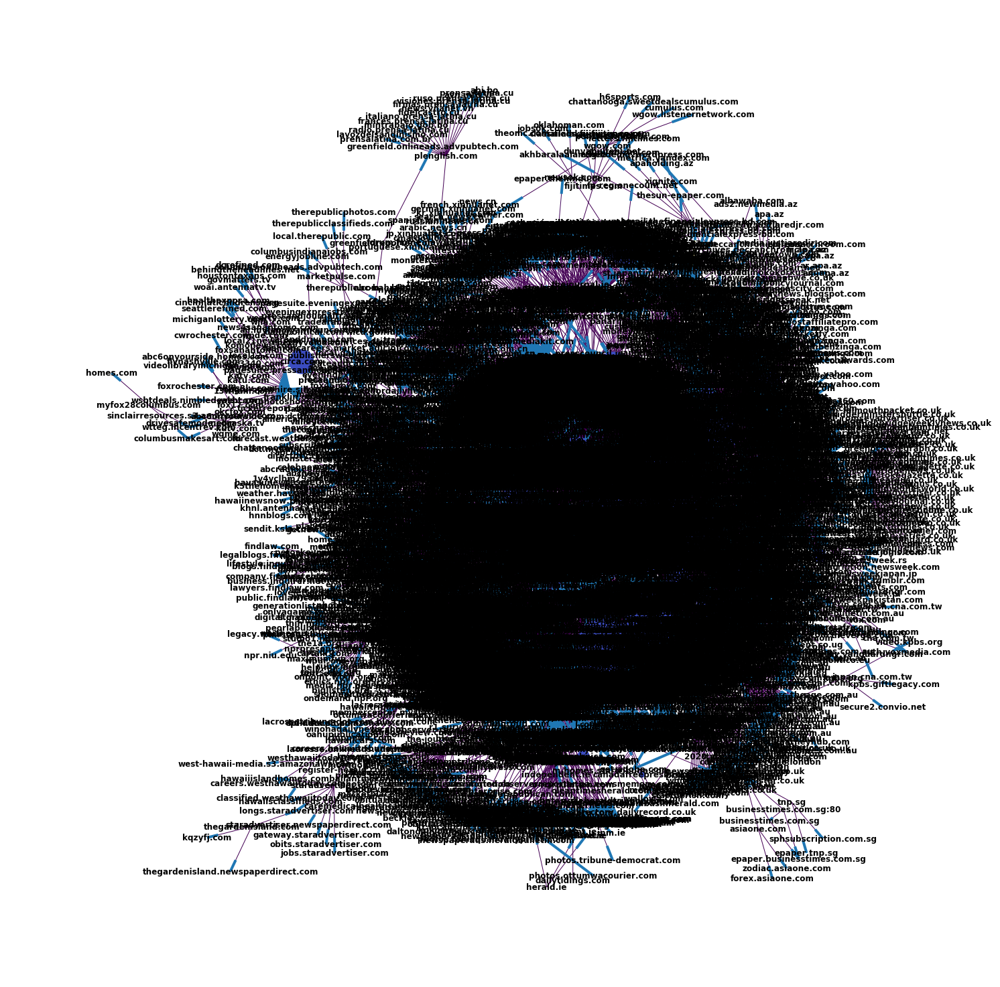

In [52]:
makeDiGraph(boss=True, key='a', minsamp=300)

In [53]:
fcounts = {'a':{}, 'img':{}, 'script':{}, 'link':{}}
for key in fcounts:
    for src in counts[key]:
        pairs = itertools.combinations(list(counts[key][src].keys()), 2)
        for pair in pairs:
            if pair[0] not in fcounts[key]:
                fcounts[key][pair[0]] = {}
            if pair[1] not in fcounts[key][pair[0]]:
                fcounts[key][pair[0]][pair[1]] = 0
            fcounts[key][pair[0]][pair[1]] += 1

In [54]:
def makeCdnGraph(boss=False):
    blacklist = ['apis.google.com', 'ajax.googleapis.com', 'www.googletagservices.com', 'platform.twitter.com', 'www.google.com', 'widgets.outbrain.com', 'c.amazon-adsystem.com']
    #['fonts.googleapis.com', 'plus.google.com', 'securepubads.g.doubleclick.net', '1.gravatar.com', 'wp.me', 'www.googletagservices.com']
    minsamp = 10
    key = 'script'
    fc = fcounts[key]
    G = nx.Graph()
    for src in fc:
        for dst in fc[src]:
            if fc[src][dst] > minsamp and src not in blacklist and dst not in blacklist:
                G.add_edge(src, dst, weight=fc[src][dst])
    #G = max(nx.connected_component_subgraphs(G), key=len)
    pos = graphviz_layout(G, 'neato')

    d = [G.degree()[k] for k in G.nodes()]
    mds = np.where(np.array(d) >= sorted(d)[-10])[0]
    for md in mds:
        print(G.nodes()[md] + " : " + str(d[md]))
    
    
    ec = [0]*len(G.edges())
    ew = [0]*len(G.edges())
    ns = [0]*len(G.nodes())
    for src in fc:
        for dst in fc[src]:
            if dst in G.nodes() and src in G.nodes():
                ns[G.nodes().index(dst)] += fc[src][dst]
            
    maWe = 0
    miWe = 100
    for i, edge in enumerate(G.edges(data=True)):
        src = edge[0]
        dst = edge[1]
        #print(i)
        ew[i] = edge[2]['weight']
        ew[i] = math.log(ew[i])
        maWe = max(maWe, ew[i])
        miWe = min(miWe, ew[i])
    print("Min Weight: " + str(miWe))
    print("Max Weight: " + str(maWe))

    plt.figure(1, (20, 20))
    nx.draw(G, pos, node_size=ns, node_color=ns, cmap=plt.cm.viridis, edge_color=ew, edge_cmap=plt.cm.viridis, width=ew)
    nx.draw_networkx_labels(G, pos, font_weight='bold')
    plt.show()

stats.wp.com : 27
google.com : 64
launch.newsinc.com : 40
cdnjs.cloudflare.com : 27
googletagservices.com : 61
s2.wp.com : 33
s1.wp.com : 27
edge.quantserve.com : 34
s0.wp.com : 56
w.sharethis.com : 30
Min Weight: 2.3978952727983707
Max Weight: 6.822197390620491


/usr/local/lib/python3.5/dist-packages/networkx/drawing/nx_pylab.py:126: MatplotlibDeprecationWarning: pyplot.hold is deprecated.
    Future behavior will be consistent with the long-time default:
    plot commands add elements without first clearing the
    Axes and/or Figure.
  b = plt.ishold()
/usr/local/lib/python3.5/dist-packages/networkx/drawing/nx_pylab.py:138: MatplotlibDeprecationWarning: pyplot.hold is deprecated.
    Future behavior will be consistent with the long-time default:
    plot commands add elements without first clearing the
    Axes and/or Figure.
  plt.hold(b)
/usr/local/lib/python3.5/dist-packages/matplotlib/__init__.py:917: UserWarning: axes.hold is deprecated. Please remove it from your matplotlibrc and/or style files.
  warnings.warn(self.msg_depr_set % key)
/usr/local/lib/python3.5/dist-packages/matplotlib/rcsetup.py:152: UserWarning: axes.hold is deprecated, will be removed in 3.0
  warnings.warn("axes.hold is deprecated, will be removed in 3.0")


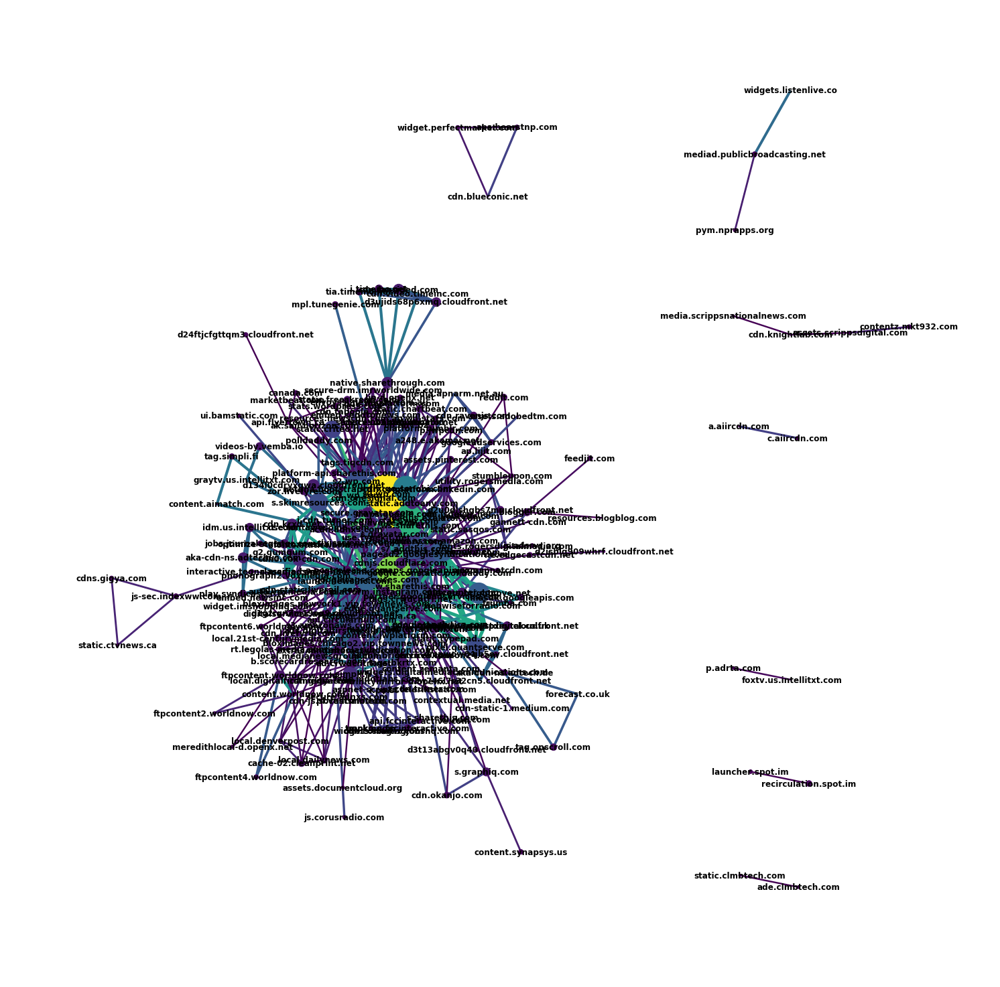

In [55]:
makeCdnGraph()